In [39]:
import igraph as ig
import pandas as pd
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import cairocffi
import random
import sys

In [40]:
# https://igraph.org/python/doc/api/igraph.Graph.html

In [124]:
def get_edge_vert(df):
    num_vertices = len(set(df["v1"].unique()).union(df["v2"].unique()))
    num_edges = df.shape[0]
    print("vertices: {:,}, edges: {:,}".format(num_vertices, num_edges))

## Mouse data

In [189]:
mouse = pd.read_csv("data/bio-mouse-gene/bio-mouse-gene.edges",sep=" ",skiprows=3,names=["v1","v2","weight"])
mouse = mouse[mouse["v1"] != mouse["v2"]]

In [190]:
get_edge_vert(mouse)

vertices: 43,126, edges: 14,461,095


In [174]:
num_nodes = 500
name = "mouse_genes"
sub = mouse[(mouse["v1"] < num_nodes) & (mouse["v2"] < num_nodes)]

In [ ]:
g = ig.Graph.DataFrame(mouse,directed=False)
# g = ig.Graph.DataFrame(sub,directed=False)

In [ ]:
num_comp(g)

In [ ]:
summarize_graph(g)

In [56]:
random.seed(123)
ig.plot(g,"images/{}_{}.png".format(name,num_nodes),vertex_size=5)

## Berkeley Stanford Data

In [115]:
berkstan = pd.read_csv("data/web-BerkStan.txt",sep="\t",skiprows=4,names=["v1","v2"])
berkstan["max"] = berkstan.max(axis=1)
berkstan["min"] = berkstan.min(axis=1)
berkstan.drop_duplicates(["max","min"],inplace=True)
num_nodes = 1000
name = "web-BerkStan"
sub = berkstan[(berkstan["v1"] < num_nodes) & (berkstan["v2"] < num_nodes)]

In [126]:
get_edge_vert(berkstan)

vertices: 685,230, edges: 6,649,470


In [116]:
g = ig.Graph.DataFrame(sub,directed=False)

In [117]:
g.is_bipartite()

False

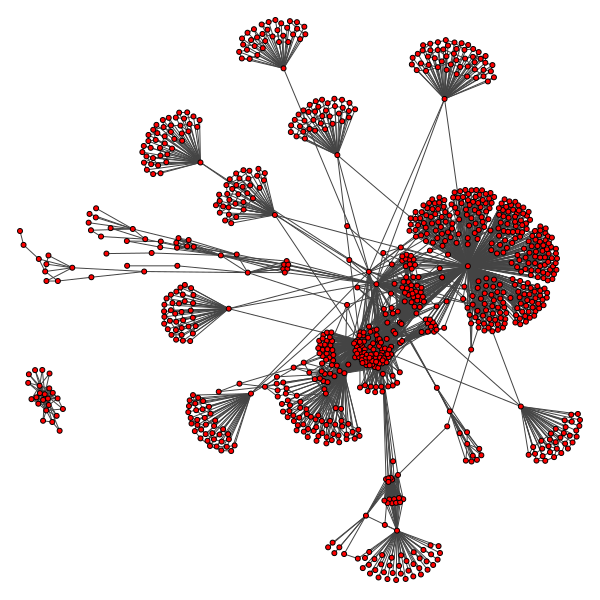

In [80]:
random.seed(123)
ig.plot(g,"images/{}_{}.png".format(name,num_nodes),vertex_size=5)

## Facebook

In [182]:
sub = pd.read_csv("data/facebook/1912.edges",sep=" ", names=["v1","v2"])
name = "facebook"
sub["max"] = sub.max(axis=1)
sub["min"] = sub.min(axis=1)
sub.drop_duplicates(["max","min"],inplace=True)
num_nodes = sub["v1"].max()

In [183]:
get_edge_vert(sub)
num_comp(g)

vertices: 747, edges: 30,025


63

In [184]:
g = ig.Graph.DataFrame(sub,directed=False)

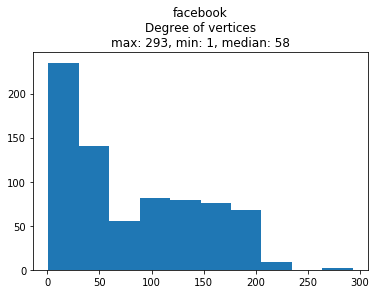

In [185]:
plot_degree(g,name)

In [168]:
summarize_graph(g)

num vertices: 747
num edges: 30,025
diameter: 7
density: 0.108
girth: 3
assortativity: 0.503


In [132]:
random.seed(123)
ig.plot(g,"images/{}_{}.png".format(name,num_nodes),vertex_size=5)

## Twitter

In [169]:
sub = pd.read_csv("data/twitter/16987303.edges",sep=" ", names=["v1","v2"])
sub["max"] = sub.max(axis=1)
sub["min"] = sub.min(axis=1)
sub.drop_duplicates(["max","min"],inplace=True)
num_nodes = sub["v1"].max()
name = "twitter"

In [170]:
get_edge_vert(sub)

vertices: 193, edges: 7,597


In [171]:
g = ig.Graph.DataFrame(sub,directed=False)

In [172]:
summarize_graph(g)

num vertices: 193
num edges: 7,597
diameter: 4
density: 0.410
girth: 3
assortativity: -0.034


In [158]:
num_comp(g)

2

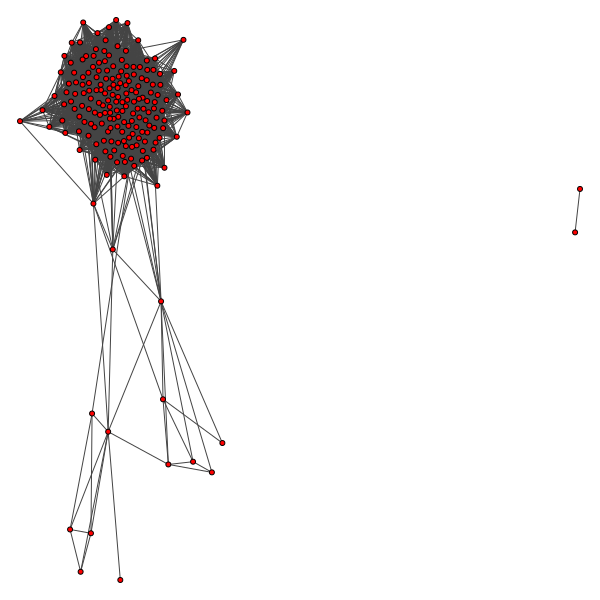

In [141]:
random.seed(123)
ig.plot(g,"images/{}_{}.png".format(name,num_nodes),vertex_size=5)

## MovieLens

In [175]:
movielens = pd.read_csv("data/archive/tag.csv",sep=",",skiprows=1,names=["v1","v2","tag","timestamp"])
movielens = movielens.drop_duplicates(["v1","v2"])
num_nodes = 2000
name = "movielens"
sub = movielens[(movielens["v1"] < num_nodes) & (movielens["v2"] < num_nodes)]
sub["v1"] = "user" + sub["v1"].astype(str)
sub["v2"] = "movie" + sub["v2"].astype(str)
movielens["v1"] = "user" + movielens["v1"].astype(str)
movielens["v2"] = "movie" + movielens["v2"].astype(str)

/Users/juliaolivieri/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/juliaolivieri/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


In [176]:
get_edge_vert(movielens)

vertices: 27,346, edges: 174,844


In [177]:

g = ig.Graph.DataFrame(movielens,directed=False)
# g = ig.Graph.DataFrame(sub,directed=False)

In [178]:
num_comp(g)

63

In [179]:
summarize_graph(g)

num vertices: 27,346
num edges: 174,844
diameter: 10
density: 0.000
girth: 4
assortativity: -0.111


In [153]:
len(set(g.clusters().membership))

6

In [154]:
def num_comp(g):
    return len(set(g.clusters().membership))

In [188]:
unique(g.clusters().membership)

[0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


(array([744.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   3.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

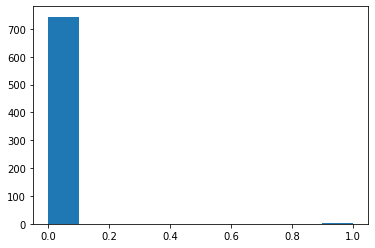

In [187]:
plt.hist(g.clusters().membership)

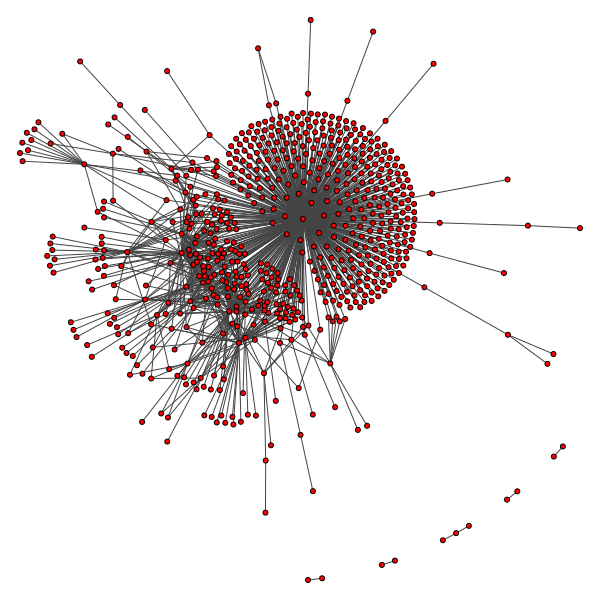

In [121]:
random.seed(123)
ig.plot(g,"images/{}_{}.png".format(name,num_nodes),vertex_size=5)

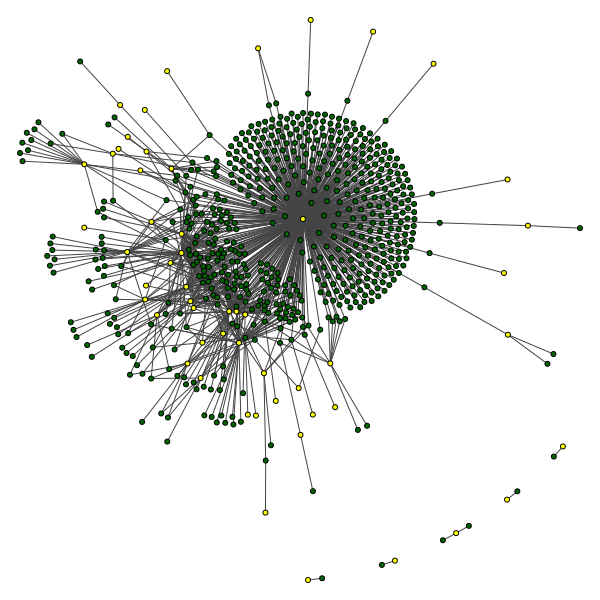

In [122]:
random.seed(123)
color_dict = {}
for v in g.vs["name"]:
    if v.startswith("movie"):
        color_dict[v] = "darkgreen"
    elif v.startswith("user"):
        color_dict[v] = "yellow"
#     else:
#         color_dict[v] = "red"
ig.plot(g,"images/{}_{}_color.png".format(name,num_nodes),vertex_size=5,vertex_color=[color_dict[x] for x in g.vs["name"]])

## Load mouse data

In [38]:
random.seed(123)
g = ig.Graph.Erdos_Renyi(100,0.025)

In [35]:
sys.getsizeof(g.get_adjlist())

7992

In [32]:
adj_mat.shape

(931, 931)

In [30]:
sys.getsizeof(adj_mat)

64

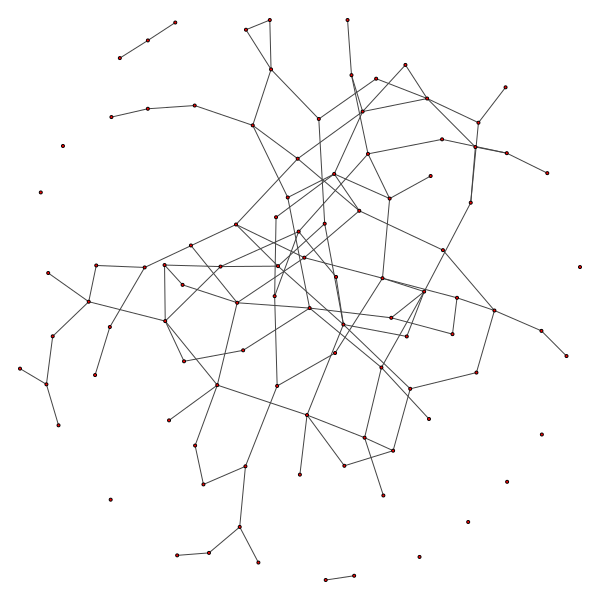

In [15]:
ig.plot(g,vertex_size=3)

In [115]:
movielens = pd.read_csv("data/archive/tag.csv",sep=",",skiprows=1,names=["v1","v2","tag","timestamp"])
movielens = movielens.drop_duplicates(["v1","v2"])
movielens["v1"] = "user" + movielens["v1"].astype(str)
movielens["v2"] = "movie" + movielens["v2"].astype(str)
movielens

,v1,v2,tag,timestamp
0,user18,movie4141,Mark Waters,2009-04-24 18:19:40
1,user65,movie208,dark hero,2013-05-10 01:41:18
2,user65,movie353,dark hero,2013-05-10 01:41:19
3,user65,movie521,noir thriller,2013-05-10 01:39:43
4,user65,movie592,dark hero,2013-05-10 01:41:18
...,...,...,...,...
465552,user138446,movie3489,Peter Pan,2013-01-23 23:30:22
465555,user138446,movie7045,family friendly,2013-01-23 23:27:40
465557,user138446,movie7164,Peter Pan,2013-01-23 23:30:55
465559,user138446,movie55999,dragged,2013-01-23 23:29:32


In [116]:
sub = movielens.head(1000)

In [103]:
len(set(movielens["v1"]).intersection(set(movielens["v2"])))

1114

## Load Facebook data

In [82]:
twitter = pd.read_csv("data/twitter/100318079.edges",sep=" ", names=["v1","v2"])
twitter

,v1,v2
0,214328887,34428380
1,17116707,28465635
2,380580781,18996905
3,221036078,153460275
4,107830991,17868918
...,...,...
8349,152388029,258140947
8350,153226312,222261763
8351,187773078,43003845
8352,394263193,94621855


In [83]:
twitter["v1"].min()

2367911

In [113]:
berkstan = pd.read_csv("data/web-BerkStan.txt",sep="\t",skiprows=4,names=["v1","v2"])
num_nodes = 1000
sub = berkstan[(berkstan["v1"] < num_nodes) & (berkstan["v2"] < num_nodes)]

In [84]:
g = ig.Graph.DataFrame(twitter,directed=False)

In [28]:
g = ig.Graph.DataFrame(sub,directed=False)

In [117]:
g = ig.Graph.DataFrame(sub,directed=False)

In [72]:
fb = pd.read_csv("data/facebook/0.edges",sep=" ", names=["v1","v2"])
fb

,v1,v2
0,236,186
1,122,285
2,24,346
3,271,304
4,176,9
...,...,...
5033,171,58
5034,326,20
5035,85,75
5036,98,332


In [71]:
min(fb["v2"])

0

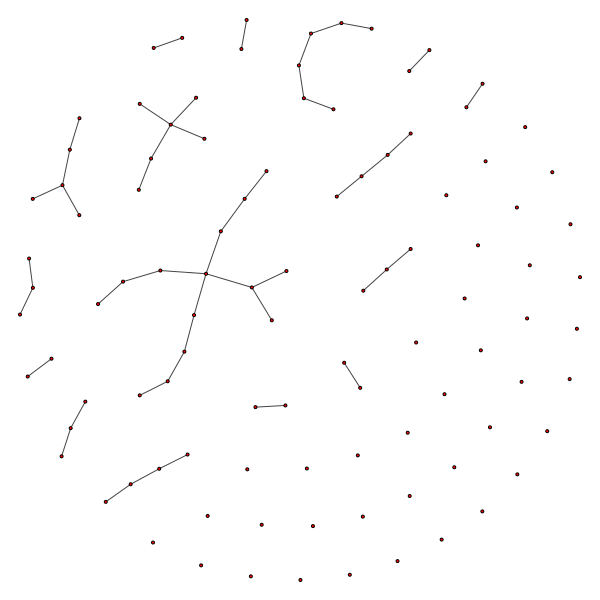

In [74]:
g = ig.Graph.DataFrame(fb,directed=False)

In [24]:
sub.shape

(44725, 3)

In [25]:
mouse.shape

(14461095, 3)

In [5]:
color_dict = {}
for v in g.vs["name"]:
    if v.startswith("movie"):
        color_dict[v] = "green"
    elif v.startswith("user"):
        color_dict[v] = "yellow"
#     else:
#         color_dict[v] = "red"
ig.plot(g,vertex_size=3,vertex_color=[color_dict[x] for x in g.vs["name"]])

KeyError: 'Attribute does not exist'

In [119]:
g.is_bipartite()

True

In [136]:
g.vs["name"]

['movie100507',
 'movie101741',
 'movie101763',
 'movie102123',
 'movie102378',
 'movie1028',
 'movie102993',
 'movie103384',
 'movie104',
 'movie104211',
 'movie104925',
 'movie105037',
 'movie106696',
 'movie1068',
 'movie1073',
 'movie1079',
 'movie108190',
 'movie1088',
 'movie1089',
 'movie109374',
 'movie11',
 'movie1123',
 'movie112556',
 'movie1136',
 'movie115149',
 'movie1162',
 'movie1175',
 'movie1177',
 'movie1193',
 'movie1197',
 'movie1201',
 'movie1203',
 'movie1207',
 'movie1208',
 'movie1212',
 'movie1213',
 'movie1242',
 'movie1247',
 'movie1248',
 'movie1252',
 'movie1258',
 'movie1265',
 'movie1270',
 'movie1280',
 'movie1281',
 'movie1288',
 'movie1298',
 'movie1307',
 'movie1345',
 'movie1348',
 'movie1358',
 'movie1359',
 'movie1372',
 'movie1380',
 'movie1391',
 'movie1396',
 'movie141',
 'movie1412',
 'movie1422',
 'movie1464',
 'movie1484',
 'movie1485',
 'movie1502',
 'movie1508',
 'movie1527',
 'movie1541',
 'movie1544',
 'movie1554',
 'movie1569',
 'movie1

## Explore attributes

In [167]:
def summarize_graph(g):
    print("num vertices: {:,}".format(g.vcount()))
    print("num edges: {:,}".format(g.ecount()))
    print("diameter: {:,}".format(g.diameter()))
    print("density: {:0.3f}".format(g.density()))
    
    # girth: length of shortest cycle
    print("girth: {:,}".format(g.girth()))
    
    # pearson correlation coefficient of degree between pairs of linked nodes
    print("assortativity: {:0.3f}".format(g.assortativity_degree()))
    

In [181]:
def plot_degree(g,name):
    plt.hist(g.degree())
    plt.title("{}\nDegree of vertices\nmax: {:,}, min: {:,}, median: {:,}".format(name,max(g.degree()), min(g.degree()), int(np.median(g.degree()))))
    plt.savefig("images/degree_{}.png".format(name),bbox_inches="tight")
    plt.show()

In [78]:
def plot_eccentricity(g,name):
    ecc = g.eccentricity()
    plt.hist(ecc)
    plt.title("{}\nEccentricity of vertices\nmax: {:,}, min: {:,}, median: {:,}".format(name,int(max(ecc)),int(min(ecc)), int(np.median(ecc))))
    plt.show()

In [79]:
def plot_centrality(g,name):
    ecc = g.eigenvector_centrality()
    plt.hist(ecc)
    plt.title("{}\nEigenvector centrality of vertices\nmax: {:,}, min: {:,}, median: {:,}".format(name,int(max(ecc)),int(min(ecc)), int(np.median(ecc))))
    plt.show()

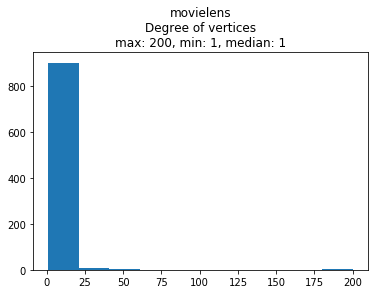

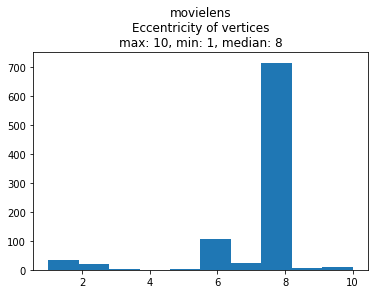

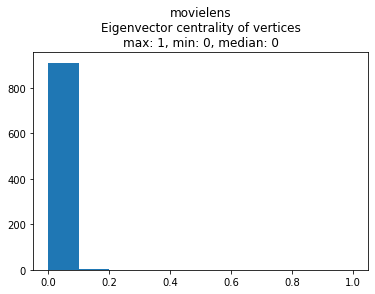

In [120]:
name = "movielens"
plot_degree(g,name)
plot_eccentricity(g,name)


plot_centrality(g,name)

In [121]:
summarize_graph(g)

num vertices: 915
num edges: 1,000
diameter: 10
density: 0.002
girth: 4
assortativity: -0.473


In [78]:

display(g2.mincut())

Cut(<igraph.Graph object at 0x124b50450>, 0.0, [], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 210, 211, 212

In [80]:
max(g2.hub_score())

1.0

In [81]:
# too long
g2.independence_number()

KeyboardInterrupt: 

In [ ]:
display(g2.diameter())
display(g2.density())
display(max(g2.eccentricity()))
display(g2.mincut())
display(g2.girth())
display(max(g2.hub_score()))
display(g2.independence_number())
display()

In [ ]:
# number of connected components
# Max cut (approximation algorithm)
# Largest clique
# Density
# Centrality
# Assortativity


In [83]:
# too long
len(g2.largest_cliques()[0])

KeyboardInterrupt: 

In [85]:
g2.eigenvector_centrality()

[0.004960765910096076,
 0.005162518850746659,
 0.005396969345140597,
 0.005480201789722322,
 0.004978342866599134,
 0.009217597811260313,
 0.013000285352310716,
 0.017091445753881912,
 0.019676046702772523,
 8.501285360850695e-08,
 8.501285361084323e-08,
 1.3224520909811567e-05,
 8.50128536131795e-08,
 8.501285360850695e-08,
 8.50128536131795e-08,
 8.501285361084323e-08,
 8.50128536131795e-08,
 2.1607526702635934e-05,
 8.501285361084323e-08,
 8.50128536131795e-08,
 2.6585332649087824e-05,
 7.580659830004386e-10,
 5.620666335584455e-07,
 7.580659822703524e-10,
 0.008663356021348066,
 0.009493557798127477,
 0.006067802472819018,
 0.00976854317921715,
 0.009933070996742042,
 0.01646658090730151,
 0.013328443106342094,
 0.026715742225491834,
 0.030786175840362796,
 8.50128536131795e-08,
 8.50128536131795e-08,
 8.50128536131795e-08,
 8.501285361084323e-08,
 8.50128536131795e-08,
 8.501285361551578e-08,
 8.501285361084323e-08,
 8.50128536131795e-08,
 8.501285361785205e-08,
 8.501285361551578

In [86]:
# too long
g2.closeness()

KeyboardInterrupt: 

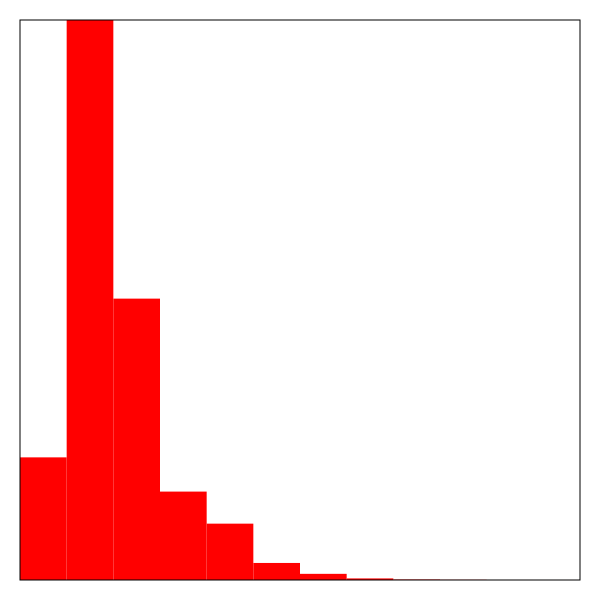

In [61]:
pl = g.path_length_hist(directed=False)
ig.plot(pl)

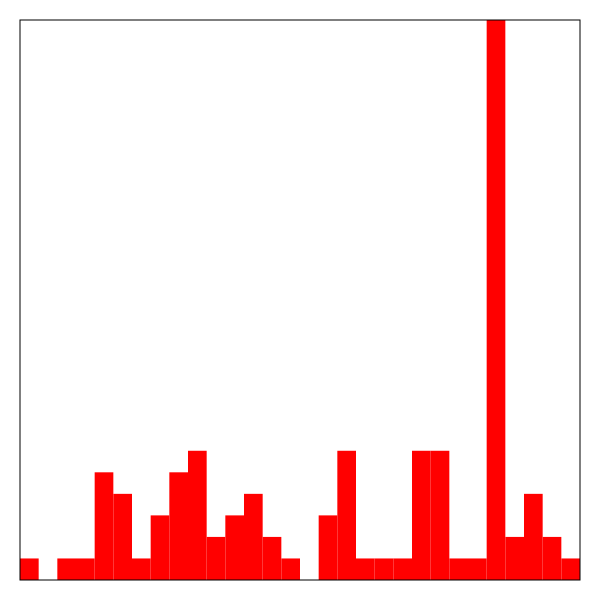

In [88]:
dd = g.degree_distribution()
ig.plot(dd)

In [62]:
pl

In [63]:
pl[0]

TypeError: 'Histogram' object is not subscriptable